In [2]:
%pip install tensorflow tqdm pillow matplotlib ipykernel
# tensorrt multiprocess dill

Note: you may need to restart the kernel to use updated packages.


<a target="_blank" href="https://colab.research.google.com/github/naddeoa/yt-data/blob/master/thumbnails.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# Set up the model

In [3]:
import logging
import os

# Quiet a few noisy logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import tensorflow as tf
# logging.disable(logging.CRITICAL)
tf.get_logger().setLevel('WARNING')

from tensorflow import keras
from tensorflow.keras import layers
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import PIL
from typing import List, Dict, Union, Tuple, Optional
import PIL.Image
# from multiprocess import Pool
from functools import partial
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Reshape, Conv2DTranspose, Flatten

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

def is_colab():
    try:
        import google.colab
        return True
    except ModuleNotFoundError:
        return False



/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Num GPUs Available:  1


In [4]:
# Hyper parameters
latent_dim = 100
BATCH_SIZE = 64
learning_rate = 0.0002 # reasonable
# learning_rate = 0.001 # super high
beta_1=0.9

In [18]:


# # Crappy generator
# def build_generator(latent_dim):
#     model = keras.Sequential([
#         layers.Dense(256, input_dim=latent_dim, activation='relu'),
#         layers.Dense(512, activation='relu'),
#         layers.Dense(1024, activation='relu'),
#         layers.Dense(3*64*64, activation='tanh'),
#         layers.Reshape((64, 64, 3))
#     ])
#     return model

# fancy generator
def build_generator(latent_dim):
    generator = Sequential(name='Generator')
    generator.add(Dense(256, input_dim=latent_dim, activation='relu', name='generator_1'))
    generator.add(Dense(8 * 8 * 128, activation='relu', name='generator_2'))
    generator.add(Reshape((8, 8, 128), name='generator_3'))
    generator.add(Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', activation='relu', name='generator_4'))
    generator.add(Conv2DTranspose(32, (4, 4), strides=(2, 2), padding='same', activation='relu', name='generator_5'))
    generator.add(Conv2DTranspose(3, (4, 4), strides=(2, 2), padding='same', activation='tanh', name='generator_6'))

    generator.summary()
    return generator

# def build_discriminator():
#     model = Sequential(name='Discriminator')
#     model.add(Flatten(input_shape=(64, 64, 3), name='discriminator_1'))
#     model.add(Dense(512, activation='relu', name='discriminator_2'))
#     model.add(Dense(256, activation='relu', name='discriminator_3'))
#     model.add(Dense(1, activation='sigmoid', name='discriminator_4'))
    
#     model.summary()
#     model.trainable = False
#     return model

def build_discriminator():
    discriminator = Sequential(name='Discriminator')
    discriminator.add(layers.Conv2D(32, (4, 4), strides=(2, 2), padding='same', activation='relu', input_shape=(64, 64, 3), name='discriminator_1'))
    discriminator.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', activation='relu', name='discriminator_2'))
    discriminator.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', activation='relu', name='discriminator_3'))
    discriminator.add(layers.Flatten(name='discriminator_4'))
    discriminator.add(layers.Dense(1, activation='sigmoid', name='discriminator_5'))

    discriminator.summary()
    # discriminator.trainable = False
    return discriminator


# Combine the generator and discriminator into a GAN
def build_gan(generator, discriminator):
    # discriminator.trainable = False
    model = keras.Sequential([
        generator,
        discriminator
    ])
    return model


def process_prediction_image(image):
    # Scale the image from [-1, 1] to [0, 1]
    image = (image + 1) / 2
    # Clip values to [0, 1] in case of any numerical instability
    image = tf.clip_by_value(image, 0, 1)
    # Convert the image tensor to a NumPy array
    return image.numpy()


def visualize_preprocessed_image(image):
    image = process_prediction_image(image)

    # Display the image
    plt.imshow(image)
    plt.axis('off')
    plt.show()

def visualize_thumbnails(image_list, rows, cols):
    # Create a grid of subplots to display the images
    fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(12, 10))

    # Iterate over the subplots and plot the generated images
    for i, ax in enumerate(axs.flat):
        # Rescale the pixel values from -1 to 1 to the range 0 to 255
        image = process_prediction_image(image_list[i])
        # image = process_prediction_image(image)
        ax.imshow(image)
        ax.axis('off')

    # Adjust the spacing between subplots
    plt.subplots_adjust(wspace=0.05, hspace=0.05)

    # Show the plot
    plt.show()

def show_samples(generator, latent_dim, rows=8, cols=8):
    noise = tf.random.normal([rows*cols, latent_dim])
    generated_thumbnails = generator.predict(noise)
    # for it in generated_thumbnails:
        # visualize_preprocessed_image(it)
    visualize_thumbnails(generated_thumbnails, rows, cols)



In [6]:

# Define the loss functions
def discriminator_loss(real_output, fake_output) -> Tuple[tf.Tensor, Tuple[tf.Tensor, tf.Tensor]]:
    # Adversarial loss or binary cross-entropy loss
    real_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones_like(real_output), real_output))
    fake_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.zeros_like(fake_output), fake_output))
    disc_loss = real_loss + fake_loss
    return disc_loss, (real_loss, fake_loss)

def generator_loss(fake_output):
    # Adversarial loss or binary cross-entropy loss
    # gen_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones_like(fake_output), fake_output))
    gen_loss = tf.keras.losses.BinaryCrossentropy()(tf.ones_like(fake_output), fake_output)
    return gen_loss


In [7]:

# Define the optimizero
generator_optimizer = keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta_1)
discriminator_optimizer = keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta_1)

if is_colab():
    weight_path = "/content/drive/MyDrive/thumbnail-project/weights"
else:
    weight_path = "./model/weights"
    # Make sure model dir exists
    if not os.path.exists("./model"):
        os.mkdir("./model")

# Training loop
@tf.function
def train_step(images,  gan, generator, discriminator, epoch, generator_every, discriminator_every):
    noise = tf.random.normal([BATCH_SIZE, latent_dim]) # Defined globally before training

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss, (real_loss, fake_loss) = discriminator_loss(real_output, fake_output)

        gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

        if generator_every > 0 and  epoch % generator_every == 0:
            generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
        
        if discriminator_every > 0 and epoch % discriminator_every== 0:
            discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
        
    return disc_loss, gen_loss, (real_loss, fake_loss)  # Return the discriminator loss as batch_loss

def load_weights(gan):
    try:
        gan.load_weights(weight_path)
        print("Loaded previous weights")
    except Exception as e:
        print(e)


def trunc(loss):
    '''Truncate loss values for display in tqdm'''
    return f'{loss:.8f}'

def train(dataset, epochs, gan, generator, discriminator, samples_after=100, discriminator_every=1, generator_every=1):
    # progress_bar_epochs = tqdm(range(epochs), desc='Epochs', position=0)
    load_weights(gan)
    
    for epoch in range(epochs):
        # progress_bar_epochs.update(1)
        
        batched_dataset = tf.data.Dataset.from_tensor_slices(dataset).shuffle(len(dataset)).batch(BATCH_SIZE)
        progress_bar_batches = tqdm(batched_dataset, position=0, leave=False)
        for image_batch in progress_bar_batches:
            disc_loss, gen_loss, (real_loss, fake_loss) = train_step(image_batch, gan, generator, discriminator, generator_every=generator_every, discriminator_every=discriminator_every, epoch=epoch)
            
            # progress_bar_batches.update(1)
            progress_bar_batches.set_postfix({'Epoch': epoch,'Gen Loss': trunc(gen_loss.numpy()), 'Disc loss': trunc(disc_loss.numpy()), ' Disc Real Loss': trunc(real_loss.numpy()), 'Disc Fake Loss': trunc(fake_loss.numpy())})
        
        # progress_bar_batches.close()

        # Update the gan model weights by setting the generator and discriminator weights
        # gan.set_weights(generator.get_weights() + discriminator.get_weights())

        # Get some samples every 20 epochs
        if epoch % samples_after == 0:
            show_samples(generator, latent_dim)
            # Also print all of the loss info
            print(f'Epoch {epoch} | Gen Loss: {gen_loss.numpy()} | Disc Loss: {disc_loss.numpy()} | Disc Real Loss: {real_loss.numpy()} | Disc Fake Loss: {fake_loss.numpy()}')

        # if epoch % discriminator_every == 0:
        #     discriminator.trainable = True
        # else:
        #     discriminator.trainable = False 
    

        gan.save_weights(weight_path)



    




# Download the dataset

In [8]:
import os
import tarfile


if is_colab():
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)

    # Specify the path to the directory containing the TGZ file
    directory_path = "/content/drive/MyDrive/thumbnail-project"

    # List the contents of the directory
    os.listdir(directory_path)



In [9]:
# This might already be done from before


if is_colab():
    # # # Specify the path to the TGZ file
    tgz_file_path = f"{directory_path}/thumbnails.tgz"
    extract_path = '/tmp/thumbnails' # Extract to local dir because I/O is horrible on google drive

    # # # Open the TGZ file
    with tarfile.open(tgz_file_path, 'r:gz') as tar:
        # Extract all files in the TGZ archive
        tar.extractall(path=extract_path)

    extract_data_dir = f'{extract_path}/data'
else:
    extract_data_dir = '/home/anthony/workspace/yt-data/data/'

print(f'Thumbnails in {extract_data_dir}')


Thumbnails in /home/anthony/workspace/yt-data/data/


In [10]:
# List the files in the extracted directory
# extract_path = f'{directory_path}/thumbnails'
file_list = os.listdir(extract_data_dir)
print(file_list[:10])
print(f'Found {len(file_list)} total files')
jpg_file_list = [file for file in file_list if file.endswith(".jpg")]
print(f'Found {len(jpg_file_list)} jpgs')

['v4HLml2Nme8.jpg', 'yDAj48iq4w8.json', 'pE9Qjif6K90.json', 'e1RSD8xLjJ8.json', 'YJKy8FehDUo.json', 'oQkn5feunx0.jpg', 'SzZutCq2-Tc.json', 'qjWLM0DDD_g.json', 'RkZNyux07aQ.json', '_7HvkhauoF8.json']
Found 52214 total files
Found 26107 jpgs


In [11]:

thumbnail_data: List[Tuple[str, str]] = [] # tuples of (path, id)

# Process or use the extracted files
for file_name in jpg_file_list:
    file_path = os.path.join(extract_data_dir, file_name)
    thumbnail_data.append((file_path, file_name.replace('.jpg', '')))

print(thumbnail_data[:10])
print(f'Found {len(thumbnail_data)} thumbnails')

[('/home/anthony/workspace/yt-data/data/v4HLml2Nme8.jpg', 'v4HLml2Nme8'), ('/home/anthony/workspace/yt-data/data/oQkn5feunx0.jpg', 'oQkn5feunx0'), ('/home/anthony/workspace/yt-data/data/IPE-3x3GFWw.jpg', 'IPE-3x3GFWw'), ('/home/anthony/workspace/yt-data/data/kbcshufA-Io.jpg', 'kbcshufA-Io'), ('/home/anthony/workspace/yt-data/data/20aG024pmLc.jpg', '20aG024pmLc'), ('/home/anthony/workspace/yt-data/data/FPYKl2X5xAc.jpg', 'FPYKl2X5xAc'), ('/home/anthony/workspace/yt-data/data/uR58CT3GksQ.jpg', 'uR58CT3GksQ'), ('/home/anthony/workspace/yt-data/data/GVNHqrNFBUA.jpg', 'GVNHqrNFBUA'), ('/home/anthony/workspace/yt-data/data/fmhkZq0NdKY.jpg', 'fmhkZq0NdKY'), ('/home/anthony/workspace/yt-data/data/Ptg2bhLcoRY.jpg', 'Ptg2bhLcoRY')]
Found 26107 thumbnails


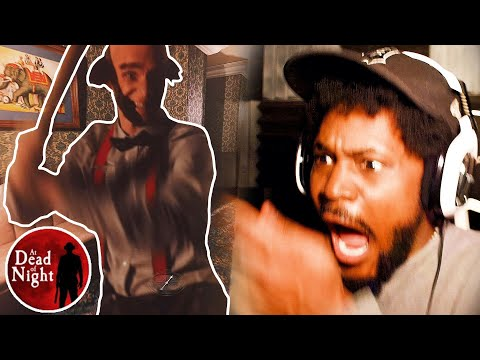

In [12]:
PIL.Image.open(thumbnail_data[0][0])

In [13]:
def load_and_preprocess_image(file_path):
    try:
        image = tf.io.read_file(file_path)
        image = tf.image.decode_jpeg(image, channels=3)  # Decode JPEG image
        image = tf.image.resize(image, [64, 64])
        image = tf.cast(image, tf.float32)
        image = (image / 255.0)  # Normalize to [0, 1]
        image = (image - 0.5) * 2  # Scale to [-1, 1]
        return image
    except Exception as e:
        print(e)

# Something doesn't work with this
def preprocess_images_parallel(image_paths, num_processes=2):
    progress = tqdm(total=len(image_paths))
    with Pool(4) as pool:
        # results = pool.map(load_and_preprocess_image, image_paths)
        print(f'preprocessing {len(image_paths)} images.')
    # preprocessed_images = list(tqdm(pool.imap(load_and_preprocess_image, image_paths), total=len(image_paths)))
        results = pool.map(load_and_preprocess_image, image_paths)
        print("results")
        print(results)
        progress.close()

    return results


# repeat the first item in thumbnail_data 10 times
# bad_data = [load_and_preprocess_image(thumbnail_data[0][0])] * 20000
# dataset = bad_data
# len(dataset)


dataset = [load_and_preprocess_image(t[0]) for t in tqdm(thumbnail_data[:20])] 
dataset = dataset * BATCH_SIZE * 5
len(dataset )

100%|██████████| 20/20 [00:00<00:00, 310.00it/s]


6400

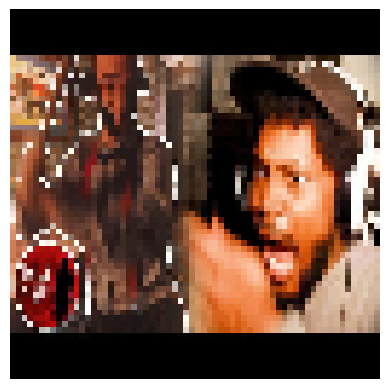

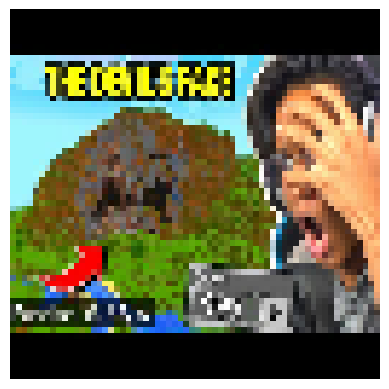

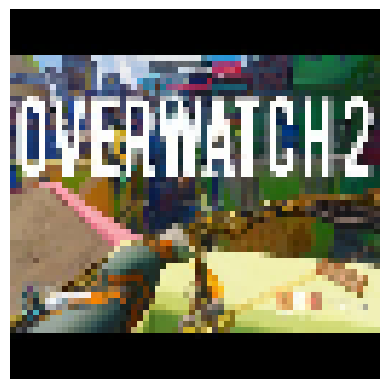

In [15]:
# Make sure the preprocessing worked


for image in dataset[:3]:
    visualize_preprocessed_image(image)


# Train the model

In [16]:


generator = build_generator(latent_dim)
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)
load_weights(gan)


Model: "Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 generator_1 (Dense)         (None, 256)               25856     
                                                                 
 generator_2 (Dense)         (None, 8192)              2105344   
                                                                 
 generator_3 (Reshape)       (None, 8, 8, 128)         0         
                                                                 
 generator_4 (Conv2DTranspos  (None, 16, 16, 64)       131136    
 e)                                                              
                                                                 
 generator_5 (Conv2DTranspos  (None, 32, 32, 32)       32800     
 e)                                                              
                                                                 
 generator_6 (Conv2DTranspos  (None, 64, 64, 3)        15

Loaded previous weights


2/2 [==============================] - 0s 5ms/step


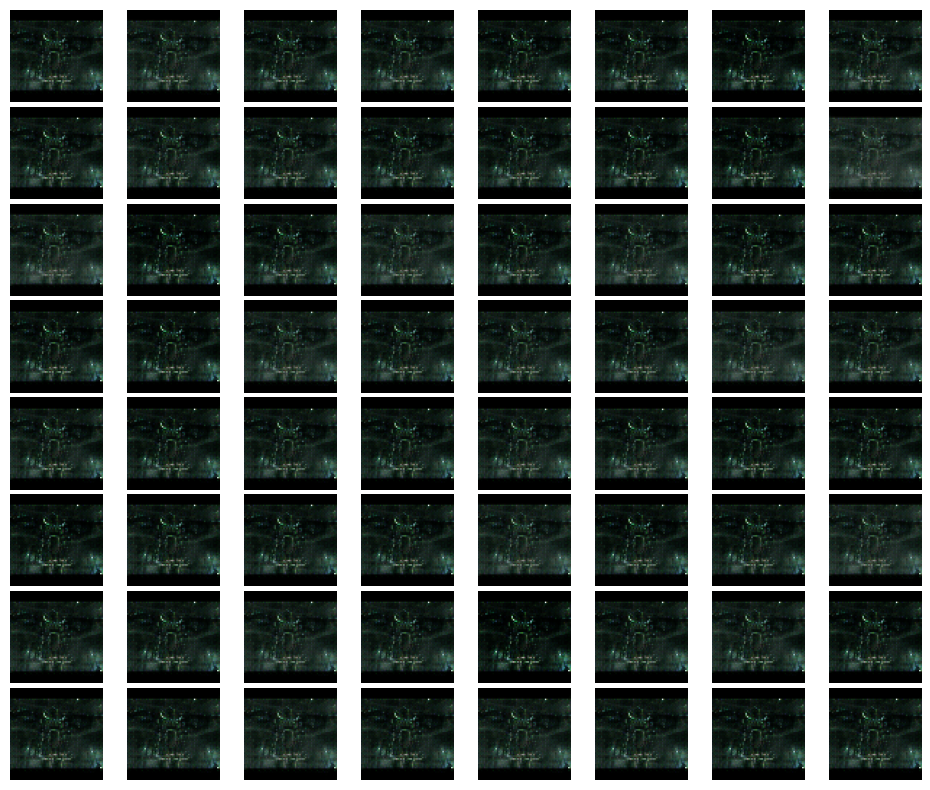

Epoch 0 | Gen Loss: 2.5250699520111084 | Disc Loss: 0.17409005761146545 | Disc Real Loss: 0.09043397009372711 | Disc Fake Loss: 0.08365608006715775


2/2 [==============================] - 0s 5ms/step


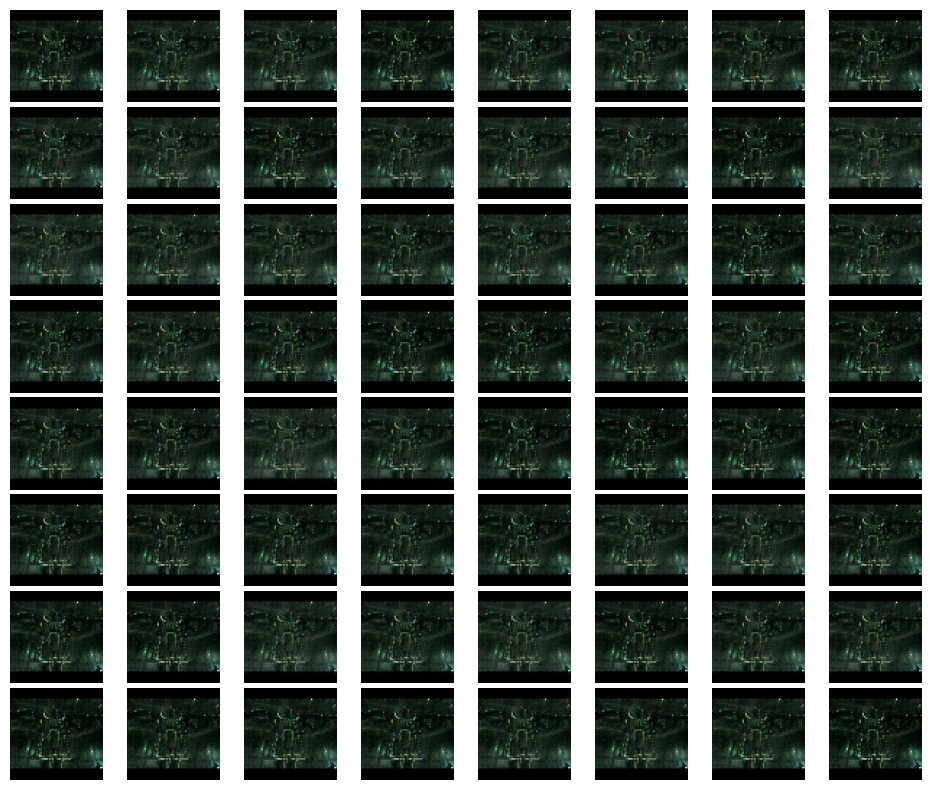

Epoch 2 | Gen Loss: 3.3478293418884277 | Disc Loss: 0.07017567753791809 | Disc Real Loss: 0.03415064513683319 | Disc Fake Loss: 0.0360250324010849


2/2 [==============================] - 0s 5ms/step


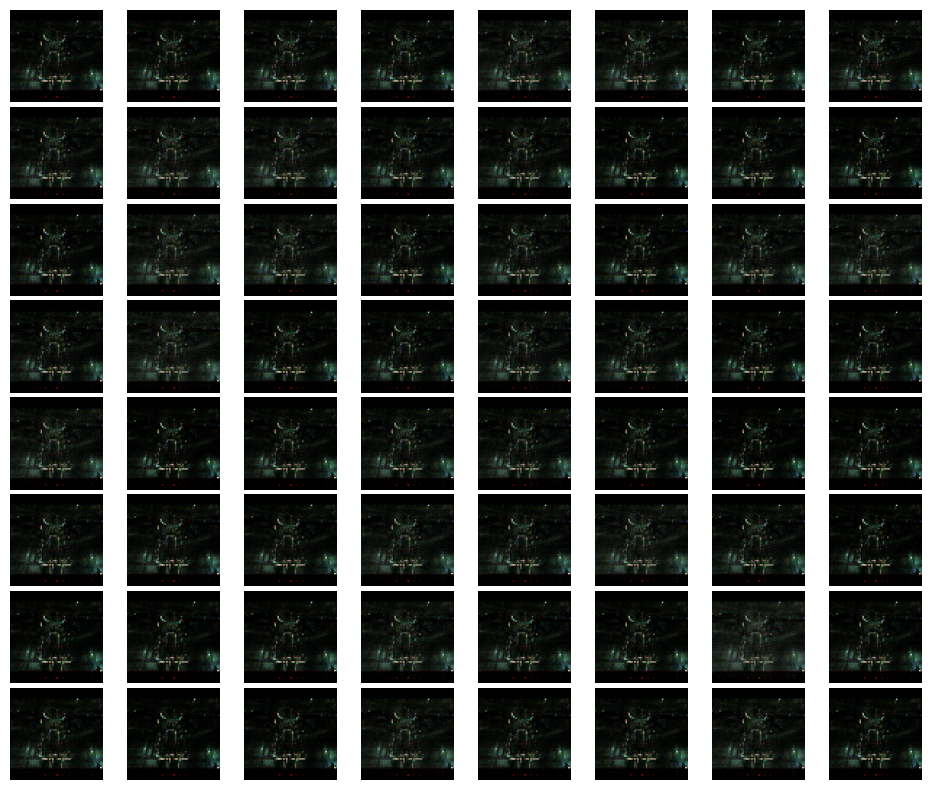

Epoch 4 | Gen Loss: 3.5946662425994873 | Disc Loss: 0.08384817838668823 | Disc Real Loss: 0.05556783452630043 | Disc Fake Loss: 0.02828034572303295


2/2 [==============================] - 0s 5ms/step


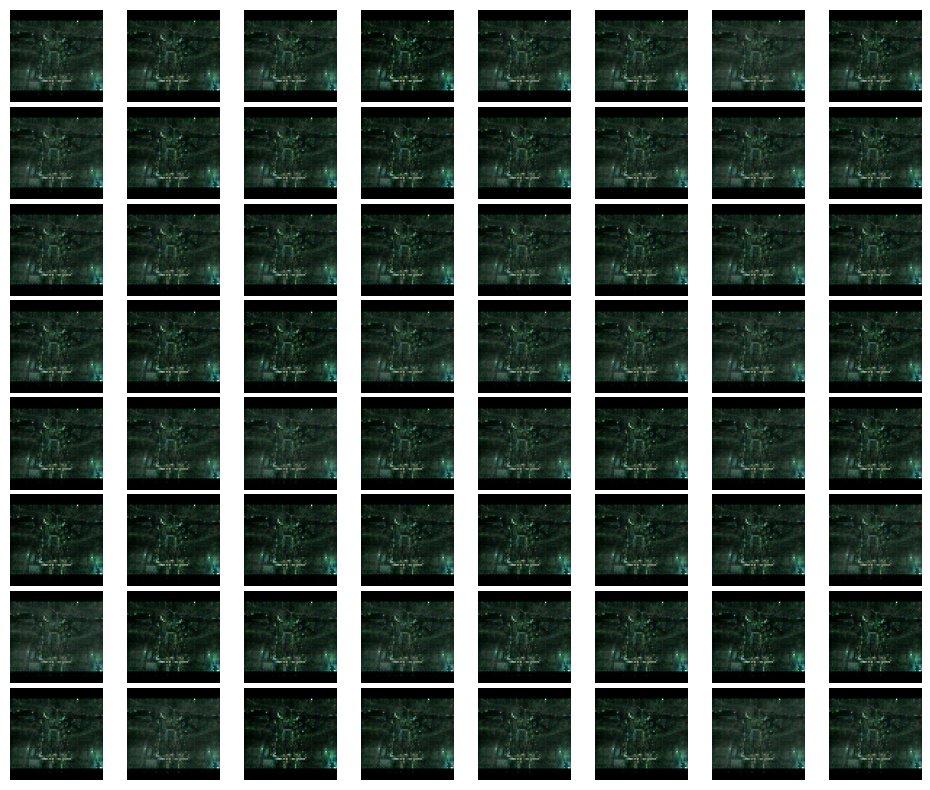

Epoch 6 | Gen Loss: 3.3159942626953125 | Disc Loss: 0.11162730306386948 | Disc Real Loss: 0.07458260655403137 | Disc Fake Loss: 0.037044696509838104


2/2 [==============================] - 0s 5ms/step


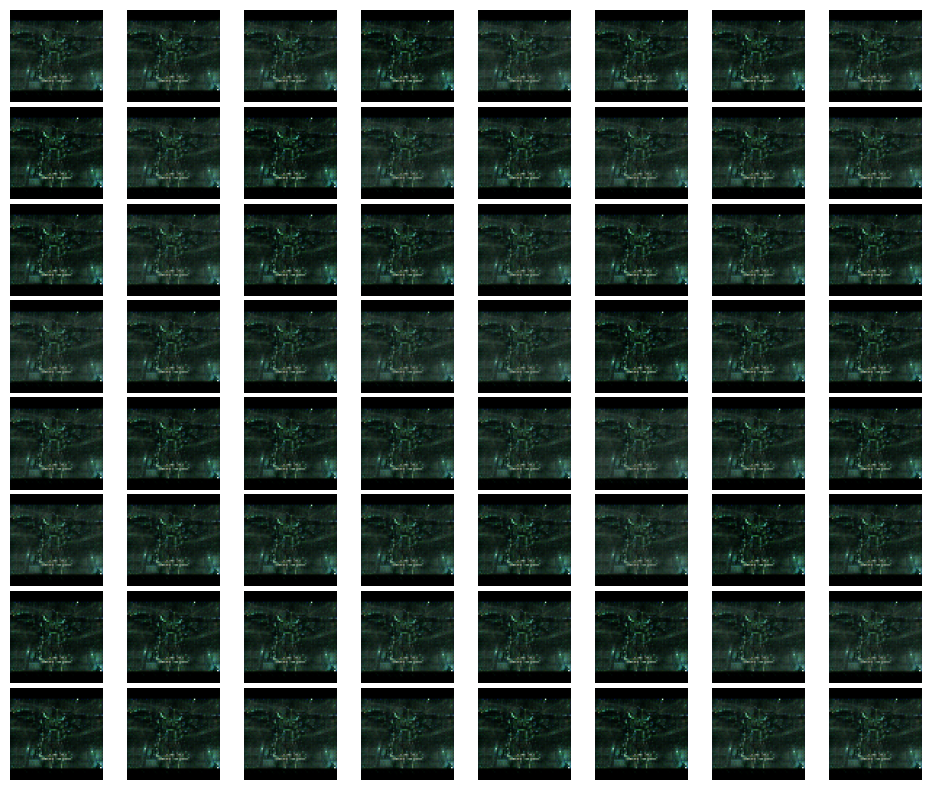

Epoch 8 | Gen Loss: 3.8172342777252197 | Disc Loss: 0.17402403056621552 | Disc Real Loss: 0.1517122983932495 | Disc Fake Loss: 0.022311735898256302


2/2 [==============================] - 0s 5ms/step


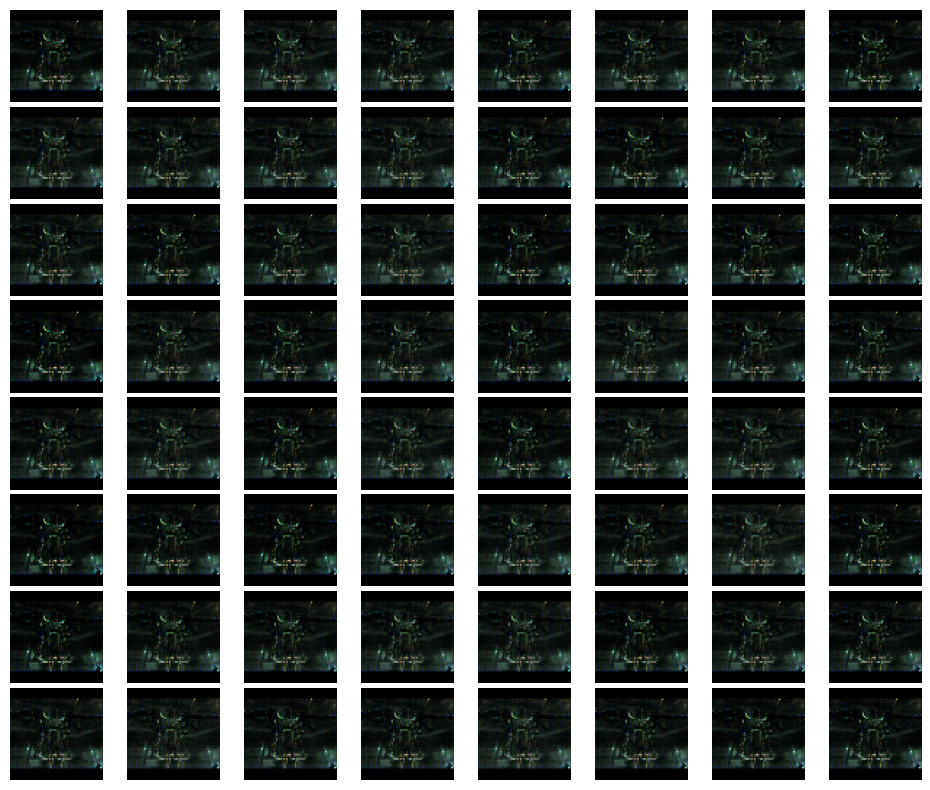

Epoch 10 | Gen Loss: 2.788756847381592 | Disc Loss: 0.2976503074169159 | Disc Real Loss: 0.22853338718414307 | Disc Fake Loss: 0.06911691278219223


KeyboardInterrupt: 

In [19]:
EPOCHS = 10000
# Train the GAN
# discriminator.trainable = True
# generator.trainable = True 
train(dataset, EPOCHS, gan=gan, discriminator=discriminator, generator=generator, samples_after=2, discriminator_every=1, generator_every=1)


# Make some stuff


In [ ]:

# Generate new thumbnails using the trained generator
noise = tf.random.normal([30, latent_dim])
generated_thumbnails = generator.predict(noise)



In [ ]:
# visualize_thumbnails(generated_thumbnails)
show_samples(generator, latent_dim)